# Required libraries

Drive was used to store checkpoints.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install numpy torch pillow torchvision opencv-python scikit-image matplotlib tqdm datasets diffusers transformers accelerate kornia huggingface_hub lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 92.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.9/484.9 kB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 73.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import numpy as np
from huggingface_hub import HfApi
from peft import PeftModel
from safetensors.torch import save_file
import torch
from PIL import Image
import kornia.color as kcolor
import torch.nn as nn
import torch.nn.functional as F
from huggingface_hub import login
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
import random
import os
import cv2
import lpips
from matplotlib import pyplot as plt
from tqdm.auto import tqdm
from datasets import load_dataset
from diffusers import (
    StableDiffusionImg2ImgPipeline,
    DPMSolverMultistepScheduler,
    UniPCMultistepScheduler,
    DDIMScheduler,
    DDPMPipeline
)
from diffusers.models import UNet2DConditionModel
from diffusers import ControlNetModel
from transformers import BlipProcessor, BlipForConditionalGeneration
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random
from peft import LoraConfig, get_peft_model

In [ ]:
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

Using device: cuda


In [ ]:
!nvidia-smi

Sun Feb 16 08:37:22 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   33C    P0             42W /  400W |       5MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

# Download of datasets

Alternative dataset based on ImageNet with reduced resolution and/or the number of samples and labels. (https://github.com/fastai/imagenette)

In [ ]:
dataset = torchvision.datasets.Imagenette(root="imagenette/", split='val', size='full', download=True)

100%|██████████| 1.56G/1.56G [01:44<00:00, 14.9MB/s]


Extracting imagenette/imagenette2.tgz to imagenette/


In [ ]:
dataset.classes

[('tench', 'Tinca tinca'),
 ('English springer', 'English springer spaniel'),
 ('cassette player',),
 ('chain saw', 'chainsaw'),
 ('church', 'church building'),
 ('French horn', 'horn'),
 ('garbage truck', 'dustcart'),
 ('gas pump', 'gasoline pump', 'petrol pump', 'island dispenser'),
 ('golf ball',),
 ('parachute', 'chute')]

Download of the ImageNet_validation dataset with 1k categories.
Since of the validation dataset we need a smaller percentage of the dataset, we've decided to exploit `streaming=True` and taking 1000 samples.

In [ ]:
login("VALID_ACCESS_TOKEN") #from HuggingFace

In [ ]:
# Load dataset in streaming mode
validation_dataset = load_dataset("timm/imagenet-1k-wds", split="validation", streaming=True)
small_dataset = validation_dataset.take(1000)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/6.30k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/1024 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/64 [00:00<?, ?it/s]

# Training dataset

## Helper functions for Dataset creation

Helper functions to check if an image is grayscale and to calculate the mean saturation of an image in HSV color space.

In [ ]:
def is_black_and_white(img):
    img_array = np.array(img)
    if len(img_array.shape) < 3 or img_array.shape[2] != 3:
        return True  # Already grayscale
    return np.all(img_array[:, :, 0] == img_array[:, :, 1]) and np.all(img_array[:, :, 1] == img_array[:, :, 2])

In [ ]:
def mean_saturation(img):
    img_hsv = img.convert('HSV')
    np_hsv = np.array(img_hsv)
    return np.mean(np_hsv[:, :, 1]) / 255.0  # Normalize to [0, 1]

## RGB dataset composition and captioning

Loading of captioning model

In [ ]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to(device)

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

In [ ]:
class PreprocessedImagenette(Dataset):
    def __init__(self, root, image_size):
        self.dataset = torchvision.datasets.ImageFolder(root=root)
        self.image_size = image_size

        # Augmentations as per paper specifications
        self.augment = A.Compose([
            A.OneOf([
                A.MotionBlur(blur_limit=5),
                A.GaussianBlur(blur_limit=(3, 7)),
            ], p=0.1),
            A.RandomBrightnessContrast(
                brightness_limit=0.1,
                contrast_limit=0.2,
                p=0.1
            ),
            A.ColorJitter(
                brightness=0,
                contrast=0,
                saturation=0.2,
                hue=0,
                p=0.1
            ),
            A.OneOf([
                A.ColorJitter(
                    brightness=0,
                    contrast=0,
                    saturation=0.4,
                    hue=0,
                    p=1.0
                ),
                A.HueSaturationValue(
                    hue_shift_limit=0,
                    sat_shift_limit=50,
                    val_shift_limit=0,
                    p=1.0
                )
            ], p=0.4),
            ToTensorV2()
        ])

        # Normalization transform for VAE
        self.normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                              std=[0.5, 0.5, 0.5])

        self.resize = transforms.Resize((image_size, image_size))
        self.grayscale = kcolor.RgbToGrayscale()
        self.caption_model = model
        self.caption_processor = processor

        # Filter dataset
        self.filtered_data = []
        for img_path, _ in self.dataset.samples:
            img = Image.open(img_path).convert('RGB')
            if is_black_and_white(img) or mean_saturation(img) < 0.18:
                continue
            self.filtered_data.append(img_path)

    def __len__(self):
        return len(self.filtered_data)

    def __getitem__(self, idx):
        img_path = self.filtered_data[idx]
        img = Image.open(img_path).convert('RGB')
        img = self.resize(img)
        img_np = np.array(img)

        augmented = self.augment(image=img_np)["image"] #Augmentation
        augmented = augmented.float() / 255.0

        rgb_img = self.normalize(augmented) #Normalization applied to everyone

        grayscale_img = self.grayscale(rgb_img)

        if random.random() < 0.9: #10% prob of taking aways captions
            inputs = self.caption_processor(
                img, return_tensors="pt"
            ).to(device)

            caption = self.caption_model.generate(
                **inputs,
                max_length=50,
                min_length=10,
                num_beams=5,
                temperature=0.5,
                top_p=0.9,
                repetition_penalty=1.5,
                no_repeat_ngram_size=3,
                do_sample=True
            )

            decoded_caption = self.caption_processor.tokenizer.decode(
                caption[0],
                skip_special_tokens=True
            )
        else:
            empty_tokenized = self.caption_processor.tokenizer("", return_tensors="pt").input_ids
            decoded_caption = self.caption_processor.tokenizer.decode(
                empty_tokenized[0],  # Get the actual token IDs
                skip_special_tokens=True
            )

        return rgb_img, grayscale_img, decoded_caption

In [ ]:
custom_dataset = PreprocessedImagenette(root="imagenette/", image_size=224) # ~2min and 30 sec

In [ ]:
sample_rgb, sample_gray, sample_caption = custom_dataset[0]

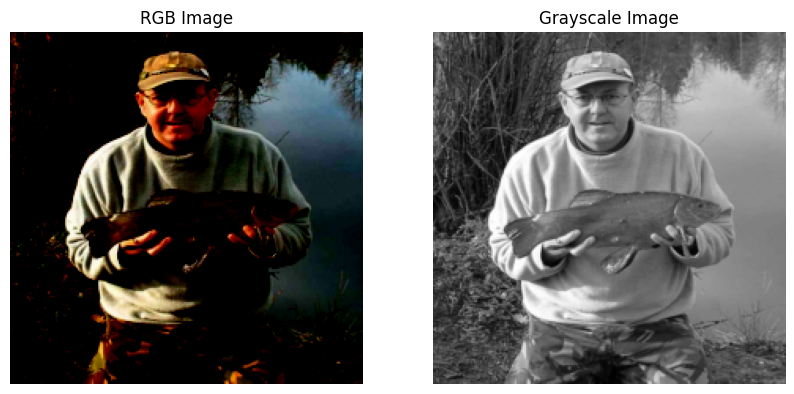

In [ ]:
rgb_image_np = sample_rgb.permute(1, 2, 0).numpy()
# # Rescale from [-1, 1] to [0, 1] if necessary to visualize
# rgb_image_np = (rgb_image_np * 0.5) + 0.5  # Assuming normalization with mean=0.5, std=0.5
# rgb_image_np = rgb_image_np.clip(0, 1)
gray_image_np = sample_gray.squeeze(0).numpy()

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(rgb_image_np)
ax[0].set_title("RGB Image")
ax[0].axis("off")

ax[1].imshow(gray_image_np, cmap="gray")
ax[1].set_title("Grayscale Image")
ax[1].axis("off")
plt.show()

In [ ]:
batch_size = 16

In [ ]:
train_loader = DataLoader(custom_dataset,
                          batch_size=batch_size,
                          shuffle=True,
                          drop_last=True)

In [ ]:
print(sample_rgb.min())
print(sample_rgb.max())

tensor(-0.9922)
tensor(1.)


# Validation set

 The dataset that is returned is a datasets.IterableDataset, not the classic map-style datasets.Dataset. To get examples from an iterable dataset, you have to iterate over it using a for loop for example.

In [ ]:
first_1000_examples = []
for i, sample in enumerate(small_dataset):
    if i >= 1000:
        break
    first_1000_examples.append(sample)

In [ ]:
first_1000_examples[0]

{'cls': 26,
 'jpg': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450>,
 'json': {'filename': 'n01630670/ILSVRC2012_val_00009670.JPEG',
  'height': 450,
  'label': 26,
  'width': 600},
 '__key__': 'ILSVRC2012_val_00009670',
 '__url__': 'hf://datasets/timm/imagenet-1k-wds@cdf403ce12f01022a0c36e584e588c0b9cebc4af/imagenet1k-validation-00.tar'}

In [ ]:
print(len(first_1000_examples))

1000


In [ ]:
class PreprocessedValidation(Dataset):
    def __init__(self, small_dataset, image_size, caption_model, caption_processor):
        self.dataset = small_dataset
        self.image_size = image_size

        self.resize = transforms.Resize((image_size, image_size))
        self.normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                           std=[0.5, 0.5, 0.5])
        self.grayscale = kcolor.RgbToGrayscale()

        self.caption_model = caption_model
        self.caption_processor = caption_processor

        self.filtered_data = []
        for sample in self.dataset:
            img = sample["jpg"].convert("RGB")
            if not is_black_and_white(img) and mean_saturation(img) >= 0.18:
                self.filtered_data.append(sample)

    def __len__(self):
        return len(self.filtered_data)

    def __getitem__(self, idx):
        sample = self.filtered_data[idx]
        img = sample["jpg"].convert("RGB")
        img = self.resize(img)
        rgb_img = transforms.ToTensor()(img)
        rgb_img = self.normalize(rgb_img)
        grayscale_img = self.grayscale(rgb_img)
        inputs = self.caption_processor(
            img,
            return_tensors="pt"
        ).to(device)

        caption = self.caption_model.generate(
            **inputs,
            max_length=50,
            min_length=10,
            num_beams=5,
            temperature=0.5,
            top_p=0.9,
            repetition_penalty=1.5,
            no_repeat_ngram_size=3,
            do_sample=True
        )

        decoded_caption = self.caption_processor.tokenizer.decode(
            caption[0],
            skip_special_tokens=True
        )

        return rgb_img, grayscale_img, decoded_caption

In [ ]:
preprocessed_dataset = PreprocessedValidation(first_1000_examples, 224, model, processor)

In [ ]:
val_loader = DataLoader(preprocessed_dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        drop_last=True)

In [ ]:
rgb, gray, caption = preprocessed_dataset[0]

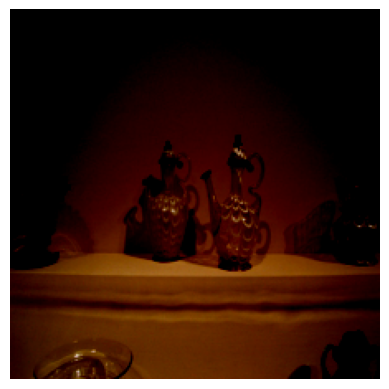

In [ ]:
rgb_image_np = rgb.permute(1, 2, 0).cpu().numpy()  # Take first image in batch

# Rescale from [-1, 1] to [0, 1] if necessary to visualize
# rgb_image_np = (rgb_image_np * 0.5) + 0.5  # Assuming normalization with mean=0.5, std=0.5
# rgb_image_np = rgb_image_np.clip(0, 1)

# Display the image
plt.imshow(rgb_image_np)
plt.axis("off")
plt.show()

In [ ]:
print(rgb.min())

tensor(-0.9765)


In [ ]:
print(rgb.max())

tensor(0.8667)


# Defining the model

Model card: https://huggingface.co/stabilityai/stable-diffusion-2-1\

It is a fine-tuned model from https://huggingface.co/stabilityai/stable-diffusion-2.

In [ ]:
model_id = "stabilityai/stable-diffusion-2-1"

In [ ]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype=torch.float32)

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer%2Fspecial_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer%2Fvocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

(…)ure_extractor%2Fpreprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder%2Fconfig.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

scheduler%2Fscheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer%2Fmerges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer%2Ftokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet%2Fconfig.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

vae%2Fconfig.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

### Definition of UNet LoRA

In Stable Diffusion UNet, LoRA is typically applied to attention layers and their projections.
- attn1 (Self-attention): Responsible for capturing local dependencies within the image
- attn2 (Cross-attention): Responsible for conditioning on the text/image embeddings
- proj_in/proj_out : Projection layers
- ff.net: Feedforward layers in Transformer blocks

In [ ]:
def print_trainable_parameters(model):
    trainable_params = 0
    all_param = 0
    for _, param in model.named_parameters():
        all_param += param.numel()
        if param.requires_grad:
            trainable_params += param.numel()
    print(
        f"trainable params: {trainable_params} || all params: {all_param} || trainable%: {100 * trainable_params / all_param}"
    )

In [ ]:
# Configure LoRA with verified target modules
lora_config = LoraConfig(
    r=16,  # Rank
    lora_alpha=32,
    target_modules=["to_k", "to_q", "to_v", "to_out.0", "ff.net.0.proj", "ff.net.2"],  # This is a broader selection, maybe high VRAM usage but covers everything
    lora_dropout=0.01,
    bias="none",
    modules_to_save=None
)

In [ ]:
pipe.vae.requires_grad_(False);
pipe.text_encoder.requires_grad_(False);

In [ ]:
pipe.unet = get_peft_model(pipe.unet, lora_config)

# Unfreeze LoRA parameters
for name, param in pipe.unet.named_parameters():
    if "lora" not in name:
        param.requires_grad = False

In [ ]:
print_trainable_parameters(pipe.unet)

trainable params: 6115328 || all params: 872026052 || trainable%: 0.7012781310804233


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

# Count parameters for each model component in the pipeline
total_params = 0
for name, component in pipe.components.items():
    if hasattr(component, "parameters"):
        num_params = count_parameters(component)
        print(f"{name}: {num_params:,} parameters")
        total_params += num_params

print(f"Total parameters in pipeline: {total_params:,}")

vae: 83,653,863 parameters
text_encoder: 340,387,840 parameters
unet: 872,026,052 parameters
Total parameters in pipeline: 1,296,067,755


In [ ]:
lora_params = sum(p.numel() for name, p in pipe.unet.named_parameters() if "lora" in name)
print(f"LoRA parameters added: {lora_params:,}")

LoRA parameters added: 6,115,328


In [ ]:
pipe = pipe.to(device)

# LoRA Training loop with Validation every 500 steps

## Loss composition

In [ ]:
lpips_loss_fn = lpips.LPIPS(net='vgg').to(device)  # VGG-based perceptual loss

class CombinedLoss(nn.Module):
    def __init__(self, lambda_mse=0.5, lambda_lpips=1.5):
        super().__init__()
        self.lambda_mse = lambda_mse
        self.lambda_lpips = lambda_lpips

    def forward(self, z_t, pred_residual, z_rgb, decoded_pred, decoded_target):
        mse_loss = F.mse_loss(z_rgb, z_t + pred_residual)
        lpips_loss = lpips_loss_fn(decoded_pred, decoded_target).mean()
        total_loss = self.lambda_mse * mse_loss + self.lambda_lpips * lpips_loss

        return total_loss, {'mse_loss': mse_loss.item(),'lpips_loss': lpips_loss.item(),'total_loss': total_loss.item()}

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 193MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


/usr/local/lib/python3.11/dist-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, map_location='cpu'), st

In [ ]:
loss_fn = CombinedLoss(lambda_mse=0.5, lambda_lpips=1.5).to(device)

##Training loop

In [ ]:
num_epochs = 3
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, pipe.unet.parameters()), lr=1e-5, fused=True)

Timestep distribution starts from U(0,1) and then gradually will reach U(0,0.05)

In [ ]:
def get_timestep_sampling(batch_size, device, global_step, min_upper_bound=0.05):
    total_steps = len(train_loader) * num_epochs

    if global_step >= total_steps:
        current_upper_bound = min_upper_bound
    else:
        progress = global_step / total_steps
        current_upper_bound = 1.0 - progress * (1.0 - min_upper_bound)

    return torch.rand(batch_size, device=device) * current_upper_bound

Checkpoint initialization to recover the training

In [ ]:
global_step = 0

checkpoint_dir = "/content/drive/MyDrive/checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_path = os.path.join(checkpoint_dir, "latest_checkpoint.pth")

# Optionally, load the checkpoint if it exists
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    pipe.unet.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    global_step = checkpoint['global_step']
    print(f"Checkpoint loaded from {checkpoint_path}, resuming from epoch {start_epoch + 1}")
else:
    start_epoch = 0  # Start fresh if no checkpoint is found

Start of the training loop

Epoch 2 Training:   0%|          | 0/659 [00:00<?, ?it/s]

Step 660
mse_loss: 0.076678
lpips_loss: 0.159618
total_loss: 0.277766
tensor([[[[0.2961]]],


        [[[0.3490]]],


        [[[0.4622]]],


        [[[0.0407]]]], device='cuda:0')


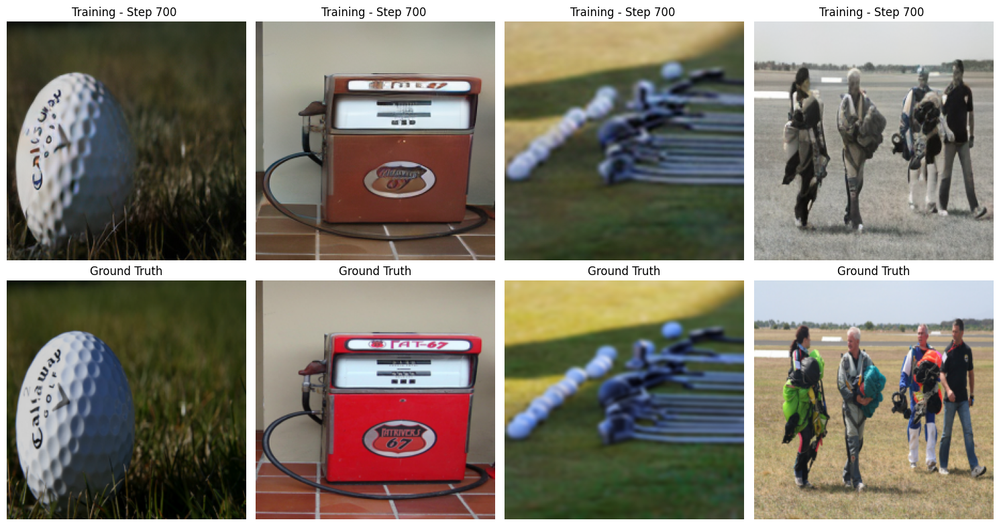

Step 710
mse_loss: 0.103324
lpips_loss: 0.184655
total_loss: 0.328644
Step 760
mse_loss: 0.088055
lpips_loss: 0.169906
total_loss: 0.298887
tensor([[[[0.4095]]],


        [[[0.0284]]],


        [[[0.3302]]],


        [[[0.2376]]]], device='cuda:0')


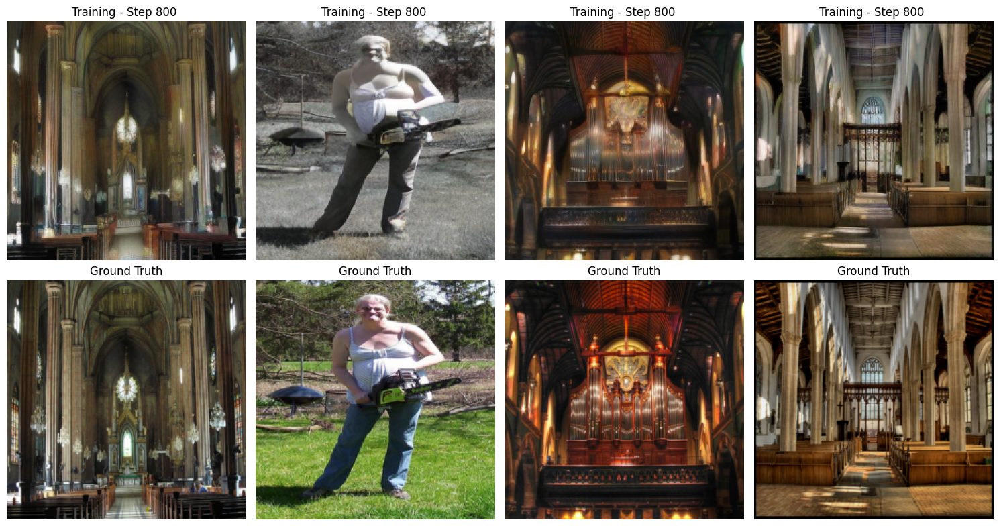

Step 810
mse_loss: 0.098472
lpips_loss: 0.164516
total_loss: 0.296010
Step 860
mse_loss: 0.118407
lpips_loss: 0.206941
total_loss: 0.369614
tensor([[[[0.2522]]],


        [[[0.2844]]],


        [[[0.3103]]],


        [[[0.1132]]]], device='cuda:0')


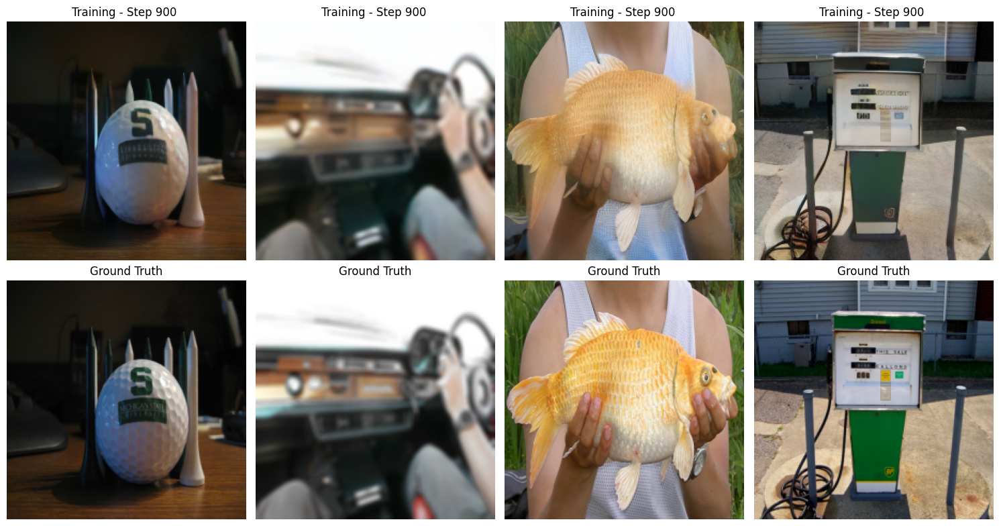

Step 910
mse_loss: 0.118527
lpips_loss: 0.204159
total_loss: 0.365501
Step 960
mse_loss: 0.098821
lpips_loss: 0.208556
total_loss: 0.362245

Performing validation at step 1000...


Validation:   0%|          | 0/49 [00:00<?, ?it/s]

tensor([[[[0.1434]]],


        [[[0.3074]]],


        [[[0.0241]]],


        [[[0.9986]]]], device='cuda:0')


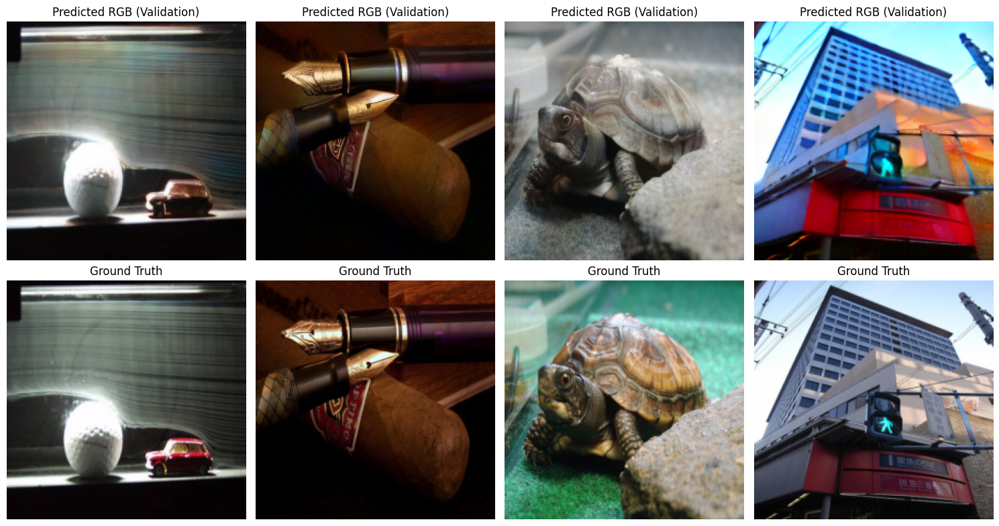

Step 1000 - Validation Loss: 0.067680
tensor([[[[0.2380]]],


        [[[0.0100]]],


        [[[0.0377]]],


        [[[0.0446]]]], device='cuda:0')


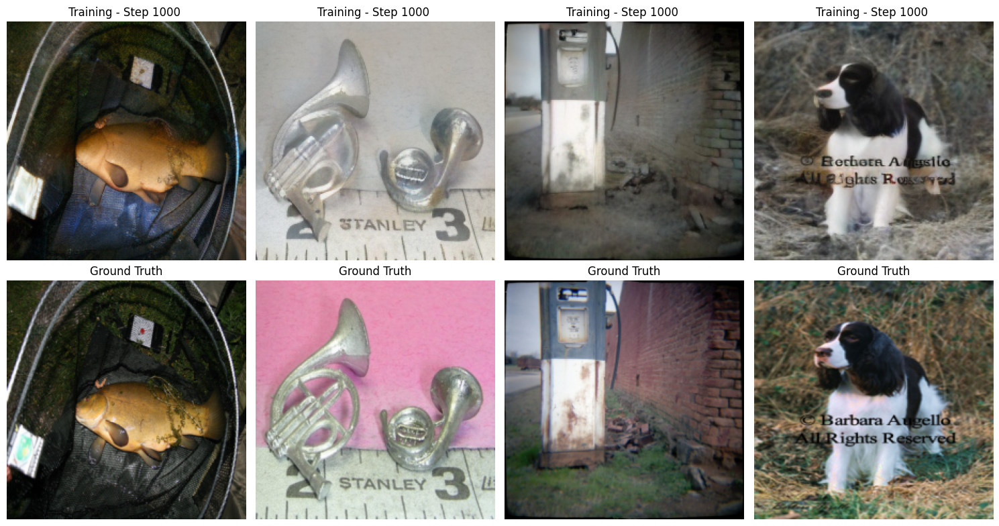

Step 1010
mse_loss: 0.126498
lpips_loss: 0.236487
total_loss: 0.417979
Step 1060
mse_loss: 0.092719
lpips_loss: 0.202293
total_loss: 0.349799
tensor([[[[0.1864]]],


        [[[0.0568]]],


        [[[0.1321]]],


        [[[0.1813]]]], device='cuda:0')


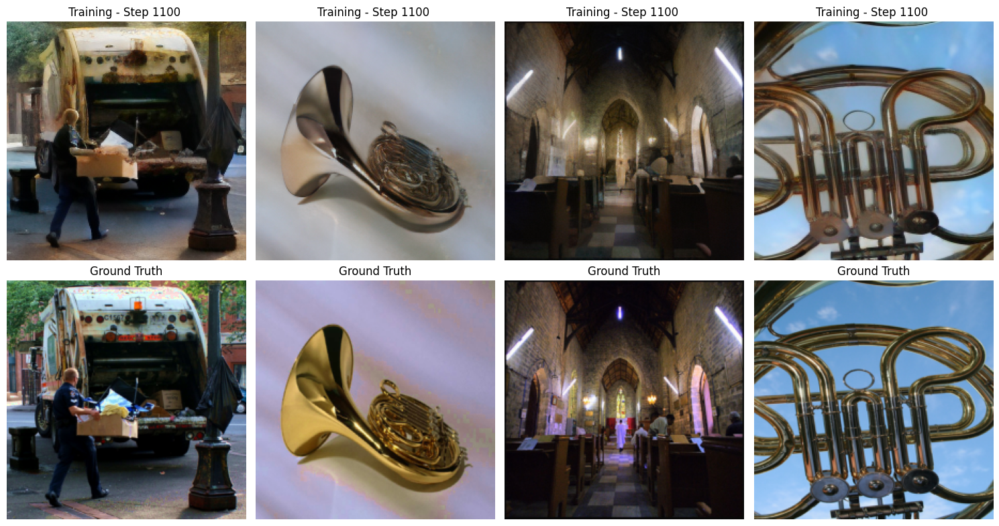

Step 1110
mse_loss: 0.110342
lpips_loss: 0.216467
total_loss: 0.379872
Step 1160
mse_loss: 0.149219
lpips_loss: 0.230797
total_loss: 0.420805
tensor([[[[0.0615]]],


        [[[0.0801]]],


        [[[0.0165]]],


        [[[0.0436]]]], device='cuda:0')


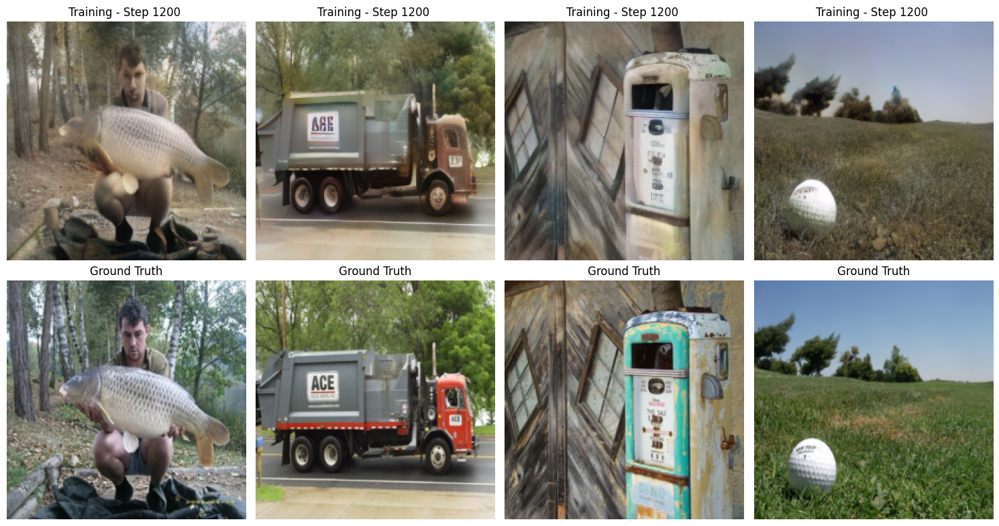

Step 1210
mse_loss: 0.119764
lpips_loss: 0.223624
total_loss: 0.395318
Step 1260
mse_loss: 0.109637
lpips_loss: 0.235863
total_loss: 0.408612
tensor([[[[0.0260]]],


        [[[0.0525]]],


        [[[0.0199]]],


        [[[0.0265]]]], device='cuda:0')


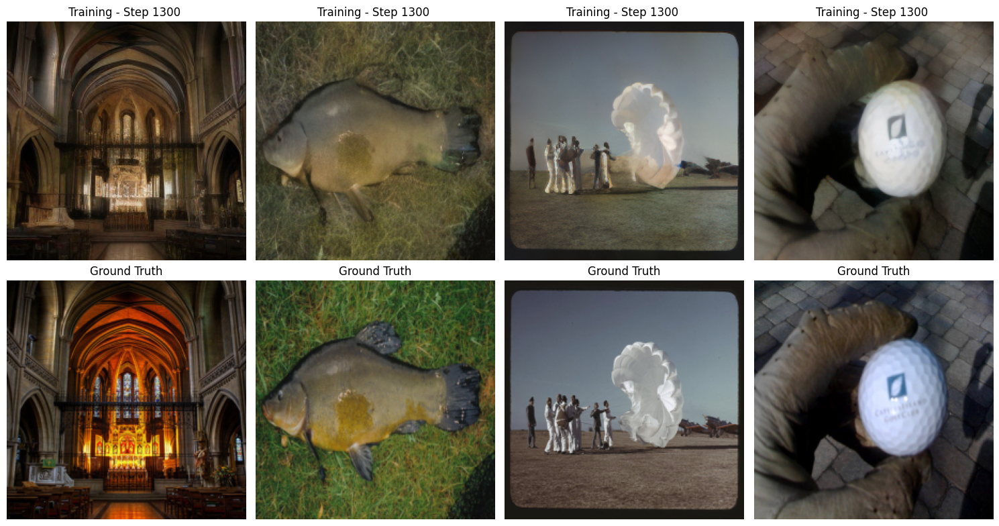

Step 1310
mse_loss: 0.146680
lpips_loss: 0.263610
total_loss: 0.468754
Epoch 2 - Average Training Loss: 0.362195
Checkpoint saved at /content/drive/MyDrive/checkpoints/latest_checkpoint.pth


In [ ]:
for epoch in range(start_epoch,num_epochs):
    pipe.unet.train()
    epoch_loss = 0

    for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1} Training")):
        rgb_input, gray_input, caption = batch
        rgb_input, gray_input = rgb_input.to(device), gray_input.to(device)
        gray_input = gray_input.repeat(1, 3, 1, 1)

        z_rgb = pipe.vae.encode(rgb_input).latent_dist.sample() * pipe.vae.config.scaling_factor # Encode for VAE
        z_gray = pipe.vae.encode(gray_input).latent_dist.sample() * pipe.vae.config.scaling_factor

        t_orig = get_timestep_sampling(batch_size, device, global_step, min_upper_bound=0.05) # Sample the timestep according to global_step
        t = t_orig.view(-1, 1, 1, 1)

        z_t = (1 - t) * z_gray + t * z_rgb # Interpolation

        text_embeddings = pipe.text_encoder(
            pipe.tokenizer(
                caption,
                return_tensors="pt",
                padding="max_length",
                max_length=pipe.tokenizer.model_max_length
            ).input_ids.to(device)
        )[0].to(dtype=torch.float32)

        pred_residual = pipe.unet( # Residual prediction made by the UNet
            z_t.to(dtype=torch.float32),
            t_orig.to(dtype=torch.float32),
            encoder_hidden_states=text_embeddings.to(dtype=torch.float32),
            return_dict=False
        )[0]

        pred_colored_latents = z_t + pred_residual
        with torch.no_grad(): # target and decoded predictions decoded back in RGB to compute the LPIPS loss
          decoded_pred = pipe.vae.decode(
              (pred_colored_latents / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
          ).sample

          decoded_target = pipe.vae.decode(
              (z_rgb / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
          ).sample

        loss, loss_dict = loss_fn(
            z_t=z_t,
            pred_residual=pred_residual,
            z_rgb=z_rgb,
            decoded_pred=decoded_pred,
            decoded_target=decoded_target
        )

        epoch_loss += loss_dict['total_loss']

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Showing results of training every 200 steps
        if global_step % 100 == 0:
          num_samples_to_show = min(4, pred_residual.shape[0])

          with torch.no_grad():
            pred_colored_latents = z_t + pred_residual

            pred_rgb_images = pipe.vae.decode(
                (pred_colored_latents / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
            ).sample

            pred_rgb_images = (pred_rgb_images / 2 + 0.5).clamp(0, 1)
            pred_rgb_images = pred_rgb_images.cpu().permute(0, 2, 3, 1).numpy()
            rgb_input_display = (rgb_input / 2 + 0.5).clamp(0, 1)
            rgb_input_display = rgb_input_display.to('cpu', dtype=float).permute(0, 2, 3, 1)

            fig, axes = plt.subplots(2, num_samples_to_show, figsize=(15, 8))

            print(t[:4])
            for i in range(num_samples_to_show):
                axes[0, i].imshow(pred_rgb_images[i])
                axes[0, i].set_title(f"Training - Step {global_step} ")
                axes[0, i].axis("off")

                axes[1, i].imshow(rgb_input_display[i])
                axes[1, i].set_title("Ground Truth")
                axes[1, i].axis("off")

            plt.tight_layout()
            plt.show()

        global_step += 1

        if batch_idx % 50 == 0:
          print(f"Step {global_step}")
          for loss_name, loss_value in loss_dict.items():
            print(f"{loss_name}: {loss_value:.6f}")

        # Perform validation every 500 steps
        if global_step % 500 == 0:
            print(f"\nPerforming validation at step {global_step}...")
            pipe.unet.eval()
            val_loss = 0

            with torch.no_grad():
                for val_batch_idx, val_batch in enumerate(tqdm(val_loader, desc="Validation")):
                    rgb_input, gray_input, caption = val_batch
                    rgb_input, gray_input = rgb_input.to(device), gray_input.to(device)
                    gray_input = gray_input.repeat(1, 3, 1, 1)

                    z_rgb = pipe.vae.encode(rgb_input).latent_dist.sample() * pipe.vae.config.scaling_factor
                    z_gray = pipe.vae.encode(gray_input).latent_dist.sample() * pipe.vae.config.scaling_factor

                    t_orig = torch.rand((batch_size,), device=device)
                    t = t_orig.view(-1, 1, 1, 1)

                    z_t = (1 - t) * z_gray + t * z_rgb

                    text_embeddings = pipe.text_encoder(
                        pipe.tokenizer(
                            caption,
                            return_tensors="pt",
                            padding="max_length",
                            max_length=pipe.tokenizer.model_max_length
                        ).input_ids.to(device)
                    )[0].to(dtype=torch.float32)

                    pred_residual = pipe.unet(
                        z_t.to(dtype=torch.float32),
                        t_orig.to(dtype=torch.float32),
                        encoder_hidden_states=text_embeddings.to(dtype=torch.float32),
                        return_dict=False
                    )[0]

                    val_loss += F.mse_loss(z_rgb, (z_t + pred_residual)).item()

                    # Visualize first 4 elements of the batch of validation results
                    if val_batch_idx == 0:
                        num_samples_to_show = min(4, pred_residual.shape[0])

                        pred_colored_latents = z_t + pred_residual

                        pred_rgb_images = pipe.vae.decode(
                            (pred_colored_latents / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
                        ).sample

                        pred_rgb_images = (pred_rgb_images / 2 + 0.5).clamp(0, 1)
                        pred_rgb_images = pred_rgb_images.cpu().permute(0, 2, 3, 1).numpy()
                        rgb_input_display = (rgb_input / 2 + 0.5).clamp(0, 1)
                        rgb_input_display = rgb_input_display.to('cpu', dtype=float).permute(0, 2, 3, 1)

                        fig, axes = plt.subplots(2, num_samples_to_show, figsize=(15, 8))

                        print(t[:4])
                        for i in range(num_samples_to_show):
                            axes[0, i].imshow(pred_rgb_images[i])
                            axes[0, i].set_title("Predicted RGB (Validation)")
                            axes[0, i].axis("off")

                            axes[1, i].imshow(rgb_input_display[i])
                            axes[1, i].set_title("Ground Truth")
                            axes[1, i].axis("off")

                        plt.tight_layout()
                        plt.show()

                avg_val_loss = val_loss / len(val_loader)
                print(f"Step {global_step} - Validation Loss: {avg_val_loss:.6f}")

            pipe.unet.train()

    avg_train_loss = epoch_loss / len(train_loader)
    print(f"Epoch {epoch+1} - Average Training Loss: {avg_train_loss:.6f}")

    # **Saving Checkpoint After Each Epoch**

    checkpoint = {
        'epoch': epoch + 1,
        'model_state_dict': pipe.unet.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'global_step': global_step,
        'avg_train_loss': avg_train_loss
    }

    torch.save(checkpoint, checkpoint_path)
    print(f"Checkpoint saved at {checkpoint_path}")

## Saving the model

In [ ]:
lora_weights = {name: param for name, param in pipe.unet.named_parameters() if "lora" in name}
torch.save(lora_weights, "lora_weights.pth")

In [ ]:
save_file(lora_weights, "lora_weights.safetensors")

In [ ]:
pipe.unet.save_pretrained("lora_unet_weights")